# Laboratory 4: Point Operators

# Pixels transforms

## Image Enhancement

In [2]:
import cv2
import sys

img = cv2.imread("Images/lowlight_1.jpg" )

if img is None:
    sys.exit("Could not read the image.")

In [3]:
import matplotlib.pyplot as plt

In [4]:
import numpy as np

print(np.max(img))
print(np.min(img))
print(img.dtype)

255
0
uint8


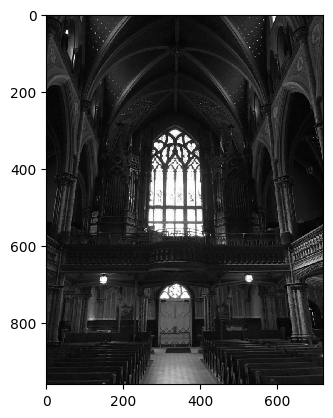

In [5]:
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

### Linear Operation

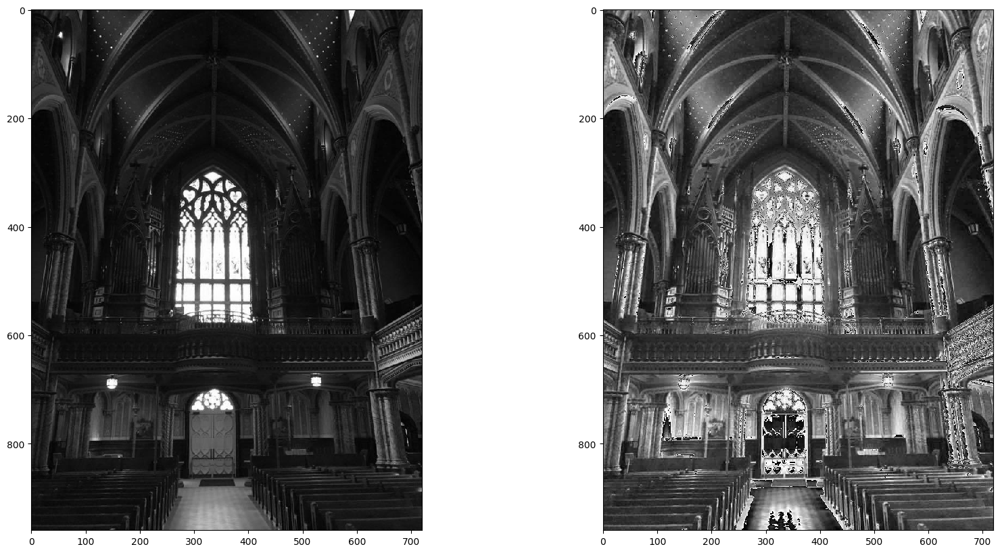

In [15]:
# Try to vary this gain and bias numbers, and see the result
gain = 3
bias = 0

img_gray_edited = gain*img_gray + bias
img_gray_edited_unit8 = np.clip(img_gray_edited, 0, 255).astype('uint8')

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_gray_edited_unit8, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

Let visualize it in histogram !

Text(0.5, 0, 'Intensity Value')

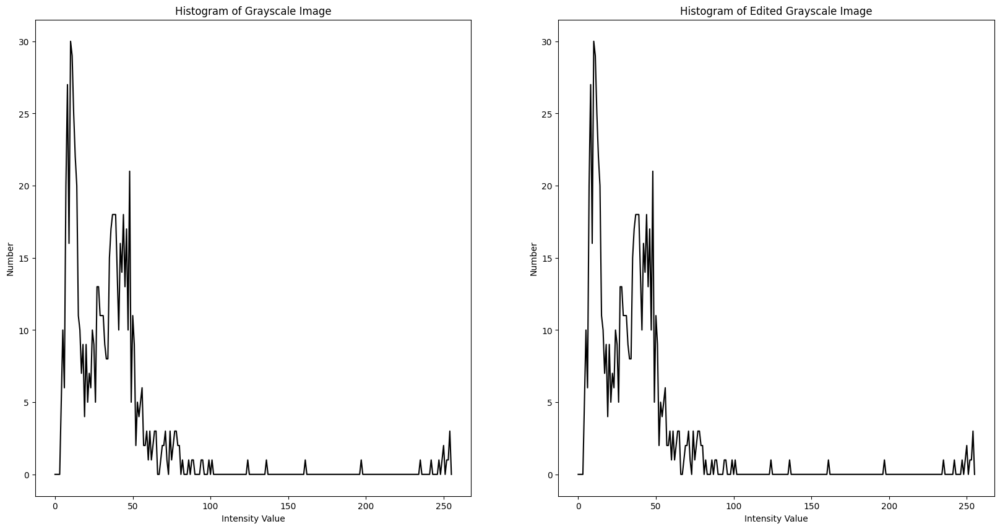

In [37]:
histogram_gray = cv2.calcHist(img_gray, [0], None, [256], [0, 256])
histogram_gray_edit = cv2.calcHist(img_gray_edited_unit8, [0], None, [256], [0, 256])

# Plot Histogram
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.plot(histogram_gray, color='k')
ax1.set_title('Histogram of Grayscale Image')
ax1.set_ylabel('Number')
ax1.set_xlabel('Intensity Value')

ax2.plot(histogram_gray_edit, color='k')
ax2.set_title('Histogram of Edited Grayscale Image')
ax2.set_ylabel('Number')
ax2.set_xlabel('Intensity Value')


In [38]:
# Add your code here for RGB color image.
# Try to adjust the color intensity using linear operator.
# Try other color space (e.g. L*a*b*)

RGB

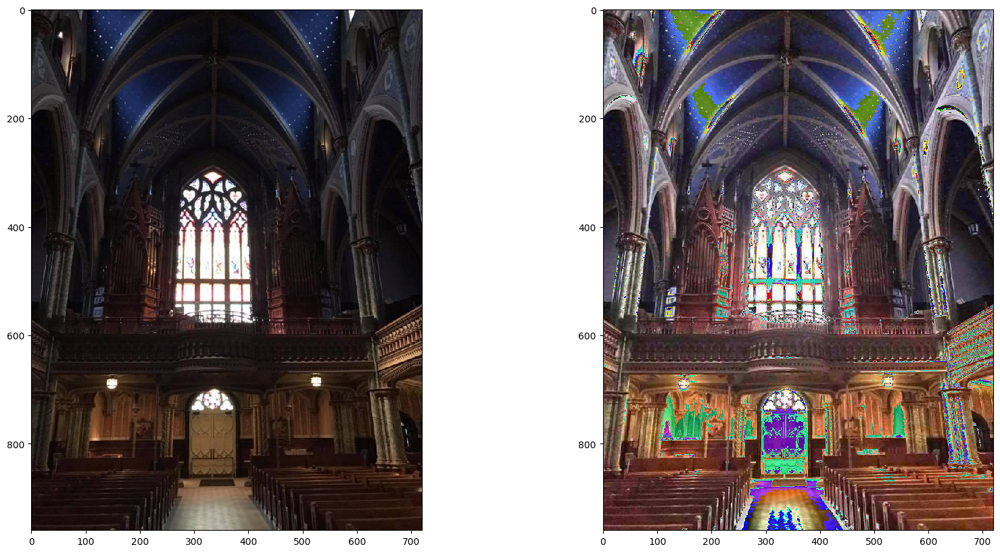

In [43]:
img_RGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
gain = 3
bias = 1

img_gray_edited = gain*img_RGB + bias
img_gray_edited_unit8 = np.clip(img_gray_edited, 0, 255).astype('uint8')

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img_RGB, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_gray_edited_unit8, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

L*a*b

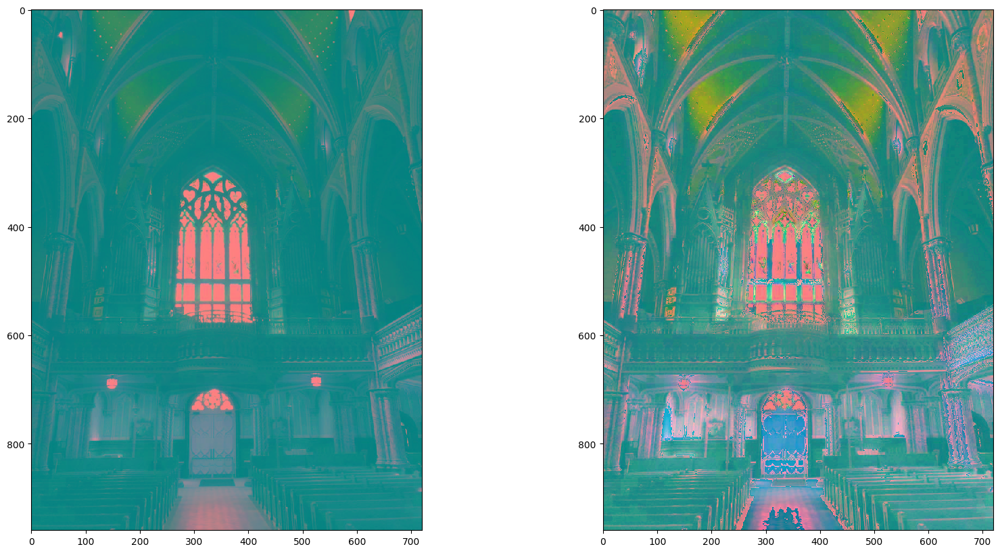

In [44]:
img_LAB = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

gain = 3
bias = 1

img_gray_edited = gain*img_LAB + bias
img_gray_edited_unit8 = np.clip(img_gray_edited, 0, 255).astype('uint8')

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img_LAB, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_gray_edited_unit8, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

### Gamma correction

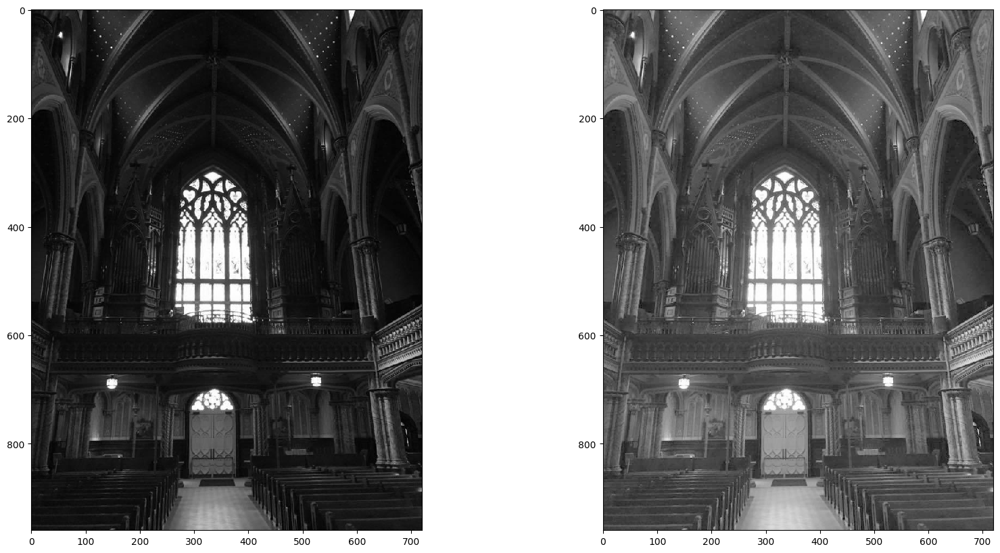

In [45]:
# Try to vary gamma
gamma = 0.5

lookUpTable = np.empty((1,256), np.uint8)
for i in range(256):
    lookUpTable[0,i] = np.clip(pow(i / 255.0, gamma) * 255.0, 0, 255)
    
image_gray_gamma = cv2.LUT(img_gray, lookUpTable)

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(image_gray_gamma, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

Text(0.5, 0, 'Intensity Value')

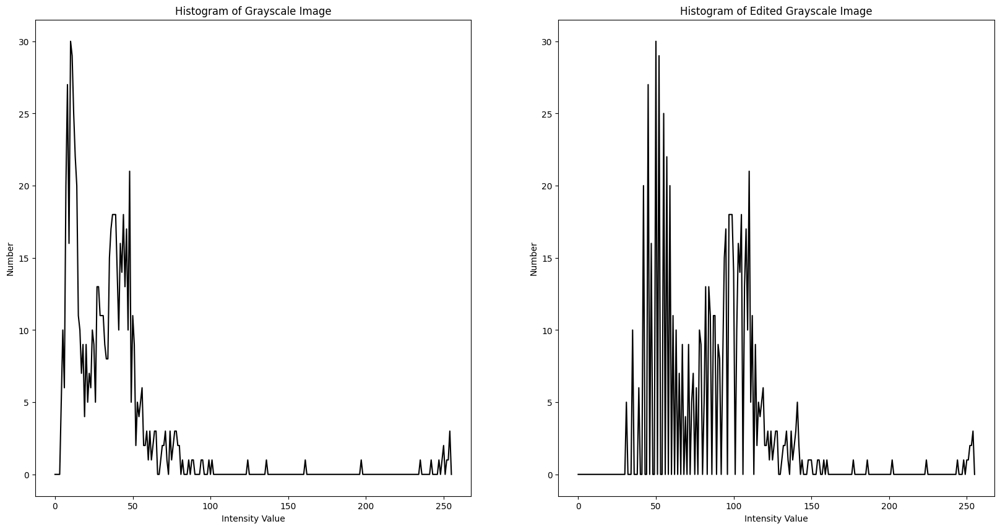

In [46]:
histogram_gray = cv2.calcHist(img_gray, [0], None, [256], [0, 256])
histogram_gray_edit = cv2.calcHist(image_gray_gamma, [0], None, [256], [0, 256])

# Plot Histogram
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.plot(histogram_gray, color='k')
ax1.set_title('Histogram of Grayscale Image')
ax1.set_ylabel('Number')
ax1.set_xlabel('Intensity Value')

ax2.plot(histogram_gray_edit, color='k')
ax2.set_title('Histogram of Edited Grayscale Image')
ax2.set_ylabel('Number')
ax2.set_xlabel('Intensity Value')

In [49]:
# Add your code here for RGB color image.
# Try to adjust the color intensity using Gamma correction.
# Try other color space (e.g. L*a*b*)

RGB

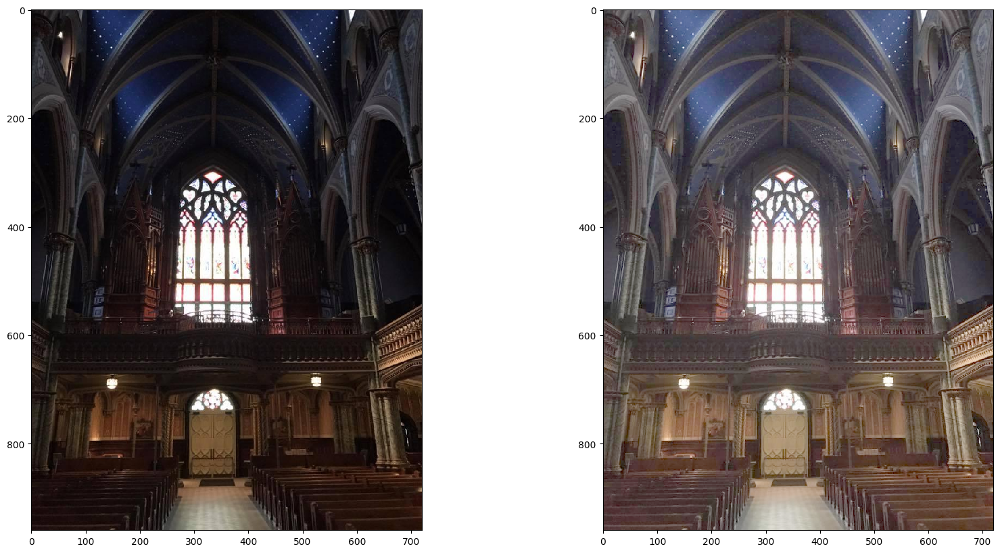

In [50]:
gamma = 0.5

lookUpTable = np.empty((1,256), np.uint8)
for i in range(256):
    lookUpTable[0,i] = np.clip(pow(i / 255.0, gamma) * 255.0, 0, 255)

    
image_gray_gamma = cv2.LUT(img_RGB, lookUpTable)

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img_RGB, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(image_gray_gamma, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

Lab

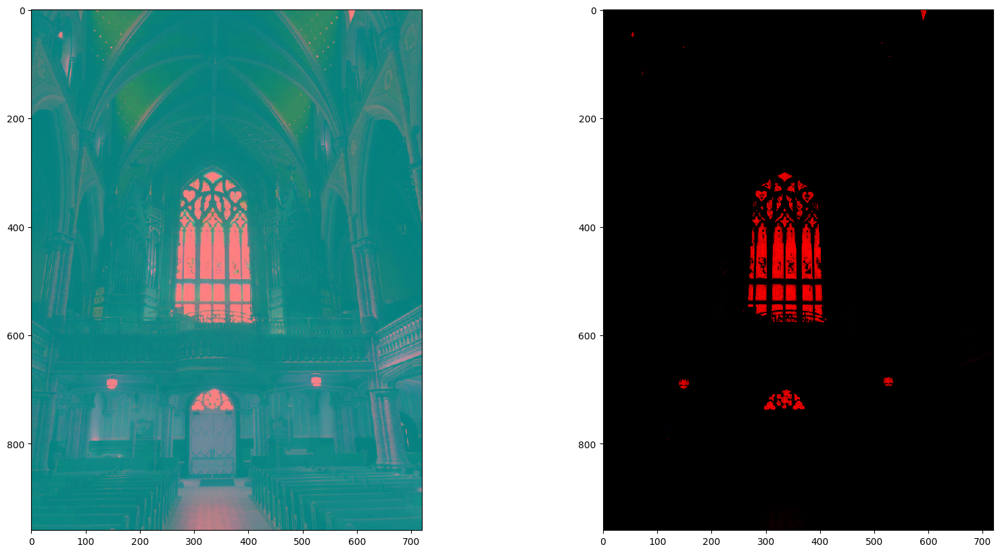

In [60]:
gamma = 10

lookUpTable = np.empty((1,256), np.uint8)
for i in range(256):
    lookUpTable[0,i] = np.clip(pow(i / 255.0, gamma) * 255.0, 0, 255)

    
image_gray_gamma = cv2.LUT(img_LAB, lookUpTable)

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img_LAB, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(image_gray_gamma, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

### Histogram Equalization

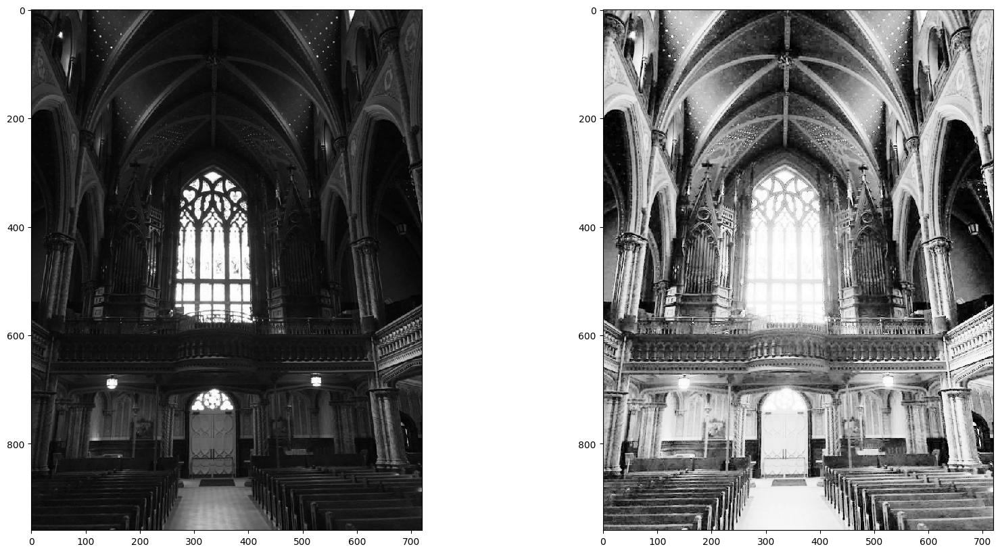

In [61]:
img_gray_hist_eq = cv2.equalizeHist(img_gray) 

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_gray_hist_eq, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

Text(0.5, 0, 'Intensity Value')

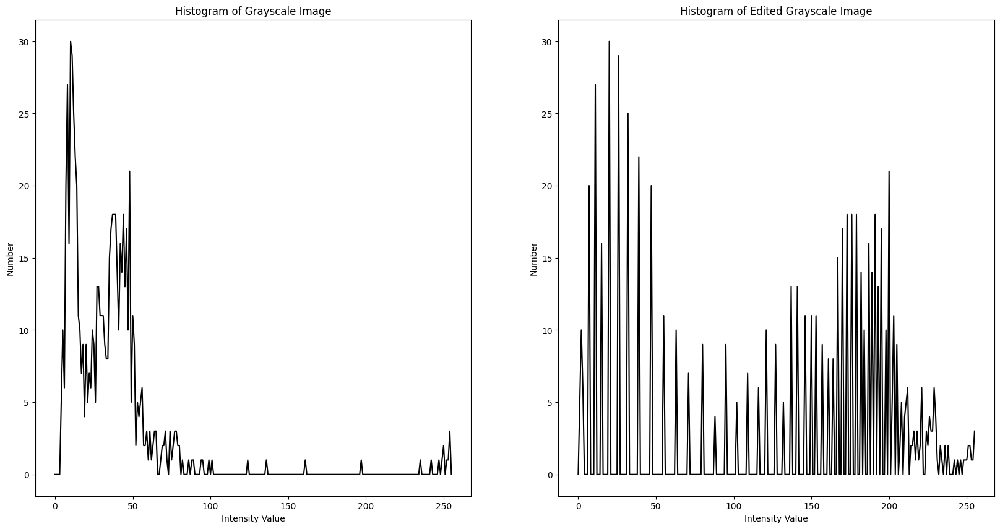

In [62]:
histogram_gray = cv2.calcHist(img_gray, [0], None, [256], [0, 256])
histogram_gray_edit = cv2.calcHist(img_gray_hist_eq, [0], None, [256], [0, 256])

# Plot Histogram
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.plot(histogram_gray, color='k')
ax1.set_title('Histogram of Grayscale Image')
ax1.set_ylabel('Number')
ax1.set_xlabel('Intensity Value')

ax2.plot(histogram_gray_edit, color='k')
ax2.set_title('Histogram of Edited Grayscale Image')
ax2.set_ylabel('Number')
ax2.set_xlabel('Intensity Value')

In [63]:
# Add your code here for RGB color image.
# Try to adjust the color intensity using Histogram Equalization.
# Try other color space (e.g. L*a*b*)

RGB

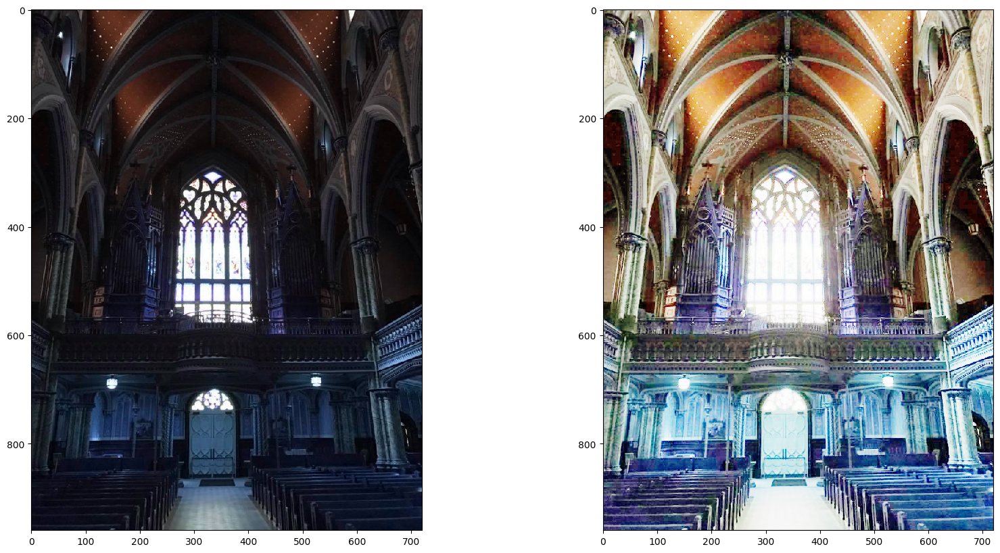

In [65]:

R, G, B = cv2.split(img)

output1_R = cv2.equalizeHist(R)
output1_G = cv2.equalizeHist(G)
output1_B = cv2.equalizeHist(B)

equ = cv2.merge((output1_R, output1_G, output1_B))

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(equ, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

Lab

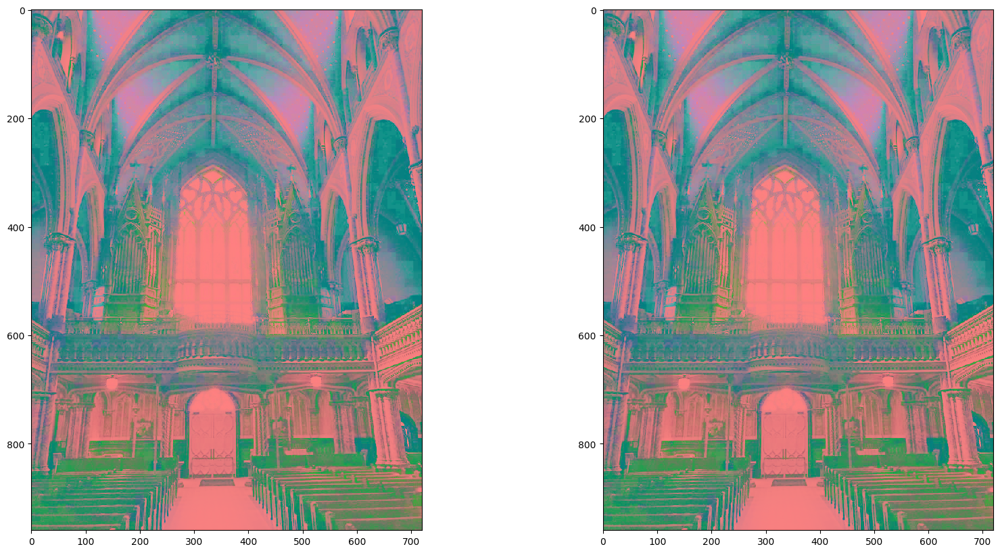

In [82]:
img_lab_hist_eq = cv2.cvtColor(equ, cv2.COLOR_RGB2LAB)
img_lab = img_lab_hist_eq

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img_lab, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_lab_hist_eq, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

## Image Matting and Compositing

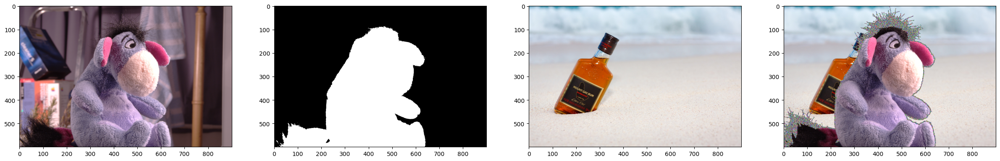

In [14]:
import cv2
import matplotlib.pyplot as plt

# Read the images
foreground = cv2.imread("Images/GT24_color.png")
background = cv2.imread("Images/background.jpg")
alpha = cv2.imread("Images/GT24_alpha.png")

foreground = cv2.resize(foreground, (900,600), interpolation= cv2.INTER_LINEAR)
background = cv2.resize(background, (900,600), interpolation= cv2.INTER_LINEAR)
alpha = cv2.resize(alpha, (900,600), interpolation= cv2.INTER_LINEAR)

# Convert uint8 to float
foreground = foreground.astype(float)
background = background.astype(float)
 
# Normalize the alpha mask to keep intensity between 0 and 1
alpha = alpha.astype(float)/255
 
# Multiply the foreground with the alpha matte
foreground_alpha = cv2.multiply(alpha, foreground)
 
# Multiply the background with ( 1 - alpha )
background_alpha = cv2.multiply(1.0 - alpha, background)
 
# Add the masked foreground and background.
outImage = cv2.add(foreground_alpha, background_alpha)*255

foreground = foreground.astype('uint8')
alpha = alpha.astype('uint8')*255
background = background.astype('uint8')
outImage = outImage.astype('uint8')*255
 
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30, 30))
ax1.imshow(cv2.cvtColor(foreground, cv2.COLOR_BGR2RGB))
ax2.imshow(cv2.cvtColor(alpha, cv2.COLOR_BGR2RGB))
ax3.imshow(cv2.cvtColor(background, cv2.COLOR_BGR2RGB))
ax4.imshow(cv2.cvtColor(outImage, cv2.COLOR_BGR2RGB))
plt.show()

# Bonus Assignment:

In [ ]:
# Read the image "rainbow.png". Apparently, there is a rainbow on this image! 
# If you try hard enough, we can see the rainbow.
# Those who can give me the rainbow will get a reward (Extra score on the midterm exam !) 

In [128]:
img_rainbow = cv2.imread("Images/rainbow.png" )

if img is None:
    sys.exit("Could not read the image.")

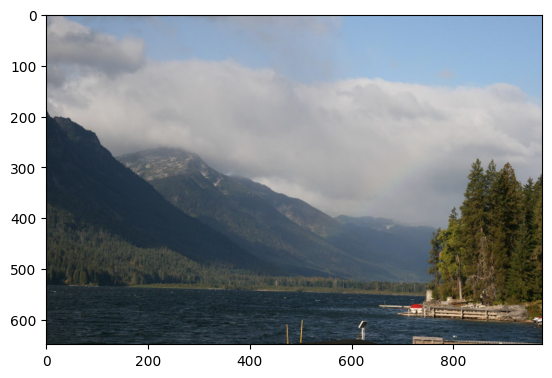

In [129]:
img_rainbow_RGB = cv2.cvtColor(img_rainbow, cv2.COLOR_BGR2RGB)

plt.imshow(img_rainbow_RGB)
plt.show()

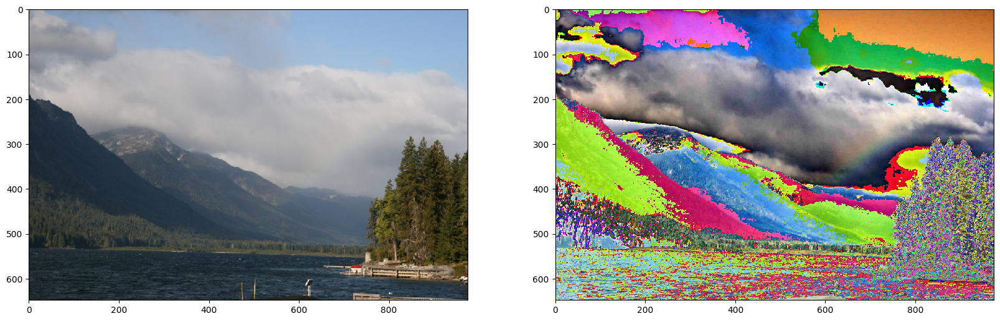

In [132]:
gain = 5
bias = 5

img_gray_edited = gain*img_rainbow_RGB + bias
img_gray_edited_unit8 = np.clip(img_gray_edited, 0, 255).astype('uint8')

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img_rainbow_RGB, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_gray_edited_unit8, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()